In [232]:
#Import packages here 
import pandas as pd 
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
import numpy as np
import pygwalker as pyg
from scipy.stats import f_oneway

## **Ideas**
Comparison: Compare the employment levels across different cities, counties, and states to identify regions with significant changes or growth in employment. Visualize the comparisons using bar charts, heatmaps, or scatter plots.

Income Quartile Analysis: Explore the employment trends based on income quartiles (emp_incq1, emp_incq2, emp_incq3, emp_incq4). Determine how employment varies among different income groups and analyze any correlations with economic indicators.

Median Income Analysis: Analyze employment trends based on median income categories (emp_incmiddle, emp_incbelowmed, emp_incabovemed). Investigate if there are differences in employment dynamics between areas with varying median incomes.

Geospatial Analysis: Use geographical visualizations like choropleth maps to represent employment levels across different geographic regions. This can provide a comprehensive view of employment distribution and trends.

Correlation Analysis: Explore correlations between employment levels and other economic factors like consumer spending, small business revenue, job postings, etc., if available in your dataset. This can uncover relationships and dependencies between different economic variables.

Forecasting: Use time series forecasting techniques to predict future employment trends at different geographic levels. This can be valuable for making informed decisions and planning strategies.

Segmentation: Segment the data based on different criteria such as industry, sector, or demographic factors and analyze employment trends within each segment. This can reveal insights specific to particular sectors or groups.


In [150]:
df_city = pd.read_csv('Data/Employment - City - Weekly.csv')
df_state = pd.read_csv('Data/Employment - State - Weekly.csv')
df_natl = pd.read_csv('Data/Employment - National - Weekly.csv')
geo_city = pd.read_csv('Data/GeoIDs - City.csv')
geo_state = pd.read_csv('Data/GeoIDs - State.csv')

In [151]:
#Renaming the day_endofweek column for simplicity purposes 
df_city.rename(columns={'day_endofweek': 'day'}, inplace=True)
df_state.rename(columns={'day_endofweek': 'day'}, inplace=True)
df_natl.rename(columns={'day_endofweek': 'day'}, inplace=True)


In [250]:
df_state

,year,month,day,statefips,emp,emp_incq1,emp_incq2,emp_incq3,emp_incq4,emp_incmiddle,emp_incbelowmed,emp_incabovemed,emp_ss40,emp_ss60,emp_ss65,emp_ss70
date,,,,,,,,,,,,,,,,
2020-01-17,2020,1,17,1,0.001490,0.007020,-0.004890,0.004890,-0.003800,-0.000051,0.001400,1.610000e-03,0.011200,0.001040,-0.001860,0.002510
2020-01-17,2020,1,17,2,-0.001290,0.034100,0.002060,-0.010600,-0.005330,-0.003830,0.007800,-8.200000e-03,-0.001690,-0.006940,-0.008110,-0.018800
2020-01-17,2020,1,17,4,-0.001460,0.002320,-0.006990,0.004070,-0.003230,-0.002240,-0.003490,1.110000e-03,0.000687,-0.007650,0.001330,-0.001350
2020-01-17,2020,1,17,5,-0.011700,-0.018700,-0.015000,-0.000009,-0.006050,-0.008330,-0.017100,-2.350000e-03,-0.010800,0.000930,0.015000,-0.072300
2020-01-17,2020,1,17,6,0.001130,0.000248,0.000916,0.002590,-0.000047,0.001660,0.000818,1.370000e-03,0.001110,0.002570,-0.000891,-0.000537
2020-01-17,2020,1,17,8,0.000437,0.007040,0.001760,-0.002000,-0.000336,-0.000256,0.003110,-1.230000e-03,0.000118,-0.004670,-0.000691,0.007390
2020-01-17,2020,1,17,9,0.000630,0.002770,-0.000955,0.003740,-0.002240,0.001430,0.000015,1.080000e-03,-0.000901,0.003940,0.001990,-0.001600
2020-01-17,2020,1,17,10,-0.002160,0.000676,-0.002070,0.000551,-0.008660,-0.000785,-0.000827,-3.560000e-03,-0.002840,-0.002930,-0.006970,0.002210
2020-01-17,2020,1,17,11,0.000737,-0.004220,0.001630,-0.000005,0.001120,0.000797,0.000879,6.760000e-04,0.007720,0.000318,0.001470,-0.006960


**Pre-processing the data for analysis**

In [153]:
#-----FOR CITY PRE-PROCESSING------
# First, combine the year, month, and day_endofweek columns into a datetime column
df_city['date'] = pd.to_datetime(df_city[['year', 'month', 'day']])

# Set the date column as the index (used to identify each row)
df_city.set_index('date', inplace=True)

#Apply the map function to each element of the df to coerce them to numeric type, and replace '.' in the df to NaNs
df_city = df_city.apply(lambda x: x.map(lambda y: pd.to_numeric(y, errors='coerce')))
df_city.replace('.', np.nan, inplace=True)

# Fill missing values with the column's mean
df_city = df_city.fillna(df_city.mean())



In [154]:
# Perform seasonal decomposition on employment rate 
result_city = seasonal_decompose(df_city['emp'], model='additive', period= 7)  # Assuming a seasonal period of 12 months

# Access the decomposed components
trend_city = result_city.trend
seasonal_city = result_city.seasonal
residual_city = result_city.resid

In [155]:
#-----FOR STATE PRE-PROCESSING------
df_state['date'] = pd.to_datetime(df_state[['year', 'month', 'day']])

#Setting the date column as the index
df_state.set_index('date', inplace=True)

#Converting to numeric from object data type (first getting rid of missing/conflicting dtypes 
df_state = df_state.apply(lambda x: x.map(lambda y: pd.to_numeric(y, errors='coerce')))
df_state.replace('.', np.nan, inplace=True)

# Fill missing values with the column's mean
df_state = df_state.fillna(df_state.mean())

In [156]:
# Perform seasonal decomposition
result_state = seasonal_decompose(df_state['emp'], model='additive', period= 7)  # Assuming a seasonal period of 12 months

# Access the decomposed components
trend_state = result_state.trend
seasonal_state = result_state.seasonal
residual_state = result_state.resid

In [157]:
#-----FOR NATIONAL PRE-PROCESSING------
df_natl['date'] = pd.to_datetime(df_natl[['year', 'month', 'day']])

#Setting the date column as the index
df_natl.set_index('date', inplace=True)

#Converting to numeric from object data type (first getting rid of missing/conflicting dtypes 
df_natl = df_natl.apply(pd.to_numeric, errors='coerce')
df_natl.replace('.', np.nan, inplace=True)

# Fill missing values with the column's mean
df_natl = df_natl.fillna(df_natl.mean())

In [158]:
# Perform seasonal decomposition
result_natl = seasonal_decompose(df_natl['emp'], model='additive', period= 7)  #Weekly frequency 

# Access the decomposed components
trend_natl = result_natl.trend
seasonal_natl = result_natl.seasonal
residual_natl = result_natl.resid

In [253]:
# Check the date format and ensure it matches the DataFrame's date format
print(df_state.index)
# Assuming df_state is indexed by a datetime column, check the index range
print(df_state.index.min(), df_state.index.max())

# Define the date ranges for before, during, and after the pandemic
before_pandemic_start = '2020-03-11'
pandemic_start = '2020-03-12'
pandemic_end = '2023-04-30'
after_pandemic_start = '2023-05-01'

# Filter the DataFrame based on date ranges using loc
st_bf_pandemic = df_state.loc[:before_pandemic_start]
st_dur_pandemic = df_state.loc[pandemic_start:pandemic_end]
st_after_pandemic = df_state.loc[after_pandemic_start:]

# Optionally, reset index for each DataFrame if needed
st_bf_pandemic.reset_index(drop=True, inplace=True)
st_dur_pandemic.reset_index(drop=True, inplace=True)
st_after_pandemic.reset_index(drop=True, inplace=True)

DatetimeIndex(['2020-01-17', '2020-01-17', '2020-01-17', '2020-01-17',
               '2020-01-17', '2020-01-17', '2020-01-17', '2020-01-17',
               '2020-01-17', '2020-01-17',
               ...
               '2024-01-12', '2024-01-12', '2024-01-12', '2024-01-12',
               '2024-01-12', '2024-01-12', '2024-01-12', '2024-01-12',
               '2024-01-12', '2024-01-12'],
              dtype='datetime64[ns]', name='date', length=10659, freq=None)
2020-01-17 00:00:00 2024-01-12 00:00:00


In [256]:
st_after_pandemic.shape

(1887, 16)

In [234]:
#Exporting cleaned DFs to CSV for analyzation
# df_city.to_csv('cleaned_city.csv', index=False)
# df_state.to_csv('cleaned_state.csv', index=False)
# df_natl.to_csv('cleaned_natl.csv', index=False)

**Performing Exploratory Data Analysis (EDA) on the dfs**

In [159]:
#Describe function to get standard stats on the data
city_desc = df_city.iloc[:, 4:].describe(include='all')
state_desc = df_state.iloc[:, 4:].describe(include='all')
natl_desc = df_natl.iloc[:, 4:].describe(include='all')

In [190]:
#One-Way ANOVA (one categorical (NAICS Supersector), six levels)
from scipy.stats import f
f_statistic, p_value = f_oneway(df_natl['emp_ss40'], df_natl['emp_ss60'], df_natl['emp_ss65'], df_natl['emp_ss70'], df_natl['emp_s72'], df_natl['emp_retail'])

print("One-Way ANOVA Results:")
print("F-statistic:", f_statistic)
print("P-value:", p_value)


df1 = 6  #Number of groups 
df2 = 203  #Sample size minus groups 
alpha = 0.05  # Example significance level

F_critical = f.ppf(1 - alpha, df1, df2)
print("F-critical:", F_critical)


One-Way ANOVA Results:
F-statistic: 344.54636945940564
P-value: 4.867855204453087e-232
F-critical: 2.143452883143562


In [188]:
#One-Way ANOVA
#Ind var: wage quartile, which has five levels: emp_incq1, emp_incq2, emp_incmiddle, emp_incq3, emp_incq4.
f_statistic, p_value = f_oneway(df_city['emp_incq1'], df_city['emp_incq2'], df_city['emp_incmiddle'], df_city['emp_incq3'], df_city['emp_incq4'])

print("One-Way ANOVA Results for the city level:")
print("F-statistic:", f_statistic)
print("P-value:", p_value)
df1 = 5  #Number of groups 
df2 = 11072  #Sample size minus groups 
alpha = 0.05  # Example significance level

F_critical = f.ppf(1 - alpha, df1, df2)
print("F-critical:", F_critical)
print(" ")

f_statistic, p_value = f_oneway(df_state['emp_incq1'], df_state['emp_incq2'], df_state['emp_incmiddle'], df_state['emp_incq3'], df_state['emp_incq4'])

print("One-Way ANOVA Results for the state level:")
print("One-Way ANOVA Results:")
print("F-statistic:", f_statistic)
print("P-value:", p_value)
df1 = 5  #Number of groups 
df2 = 10654  #Sample size minus groups 
alpha = 0.05  # Example significance level

F_critical = f.ppf(1 - alpha, df1, df2)
print("F-critical:", F_critical)
print(" ")

f_statistic, p_value = f_oneway(df_natl['emp_incq1'], df_natl['emp_incq2'], df_natl['emp_incmiddle'], df_natl['emp_incq3'], df_natl['emp_incq4'])

print("One-Way ANOVA Results for the national level:")
print("One-Way ANOVA Results:")
print("F-statistic:", f_statistic)
print("P-value:", p_value)
df1 = 5  #Number of groups 
df2 = 204  #Sample size minus groups 
alpha = 0.05  # Example significance level

F_critical = f.ppf(1 - alpha, df1, df2)
print("F-critical:", F_critical)
print(" ")

One-Way ANOVA Results for the city level:
F-statistic: 4107.339091946969
P-value: 0.0
F-critical: 2.2149066294237048
 
One-Way ANOVA Results for the state level:
One-Way ANOVA Results:
F-statistic: 3044.033593917402
P-value: 0.0
F-critical: 2.214938301023434
 
One-Way ANOVA Results for the national level:
One-Way ANOVA Results:
F-statistic: 310.9952298172819
P-value: 6.1788350238052845e-176
F-critical: 2.2583424850298113
 


**Interpreting ANOVA Results**
- When performing ANOVA on the different NAICS sectors, the p-value < 0.05 showed us there was a tatistically significant difference between the means of the groups, and that there's a high probability that different employment sectors were affected vastly different by the pandemic. 
- At the city level, we reject the null hypothesis (P-value of 0), meaning that there is a statistically significant difference between the
  means of the groups at the metro level. This also holds at the state and national levels. This means that different income-earning groups were affected differently by the pandemic. 
- As for the f-statistic, there was a much larger variation between group means at the city and state levels as compared to national levels. Additionally, the f-statistic was much larger than the f-critical value for all results, further indicating that there's a statistically significant difference between the means of the groups for all the scenarios ANOVA was performed on. 
  

**Plotting the time series decomposition**

## City Level

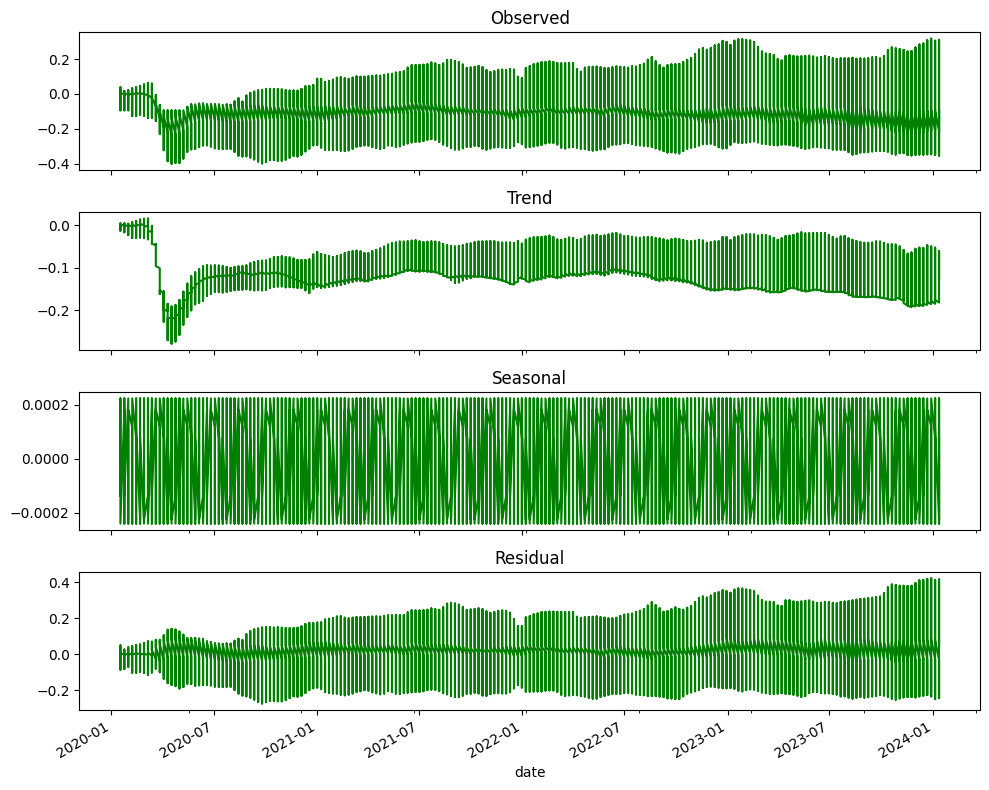

In [165]:
# Plot the decomposed components (CITY LEVEL)
fig, axes = plt.subplots(4, 1, figsize=(10, 8), sharex=True)
result_city.observed.plot(ax=axes[0], title='Observed', color='green')
result_city.trend.plot(ax=axes[1], title='Trend', color='green')
result_city.seasonal.plot(ax=axes[2], title='Seasonal', color='green')
result_city.resid.plot(ax=axes[3], title='Residual', color='green')
plt.tight_layout()
plt.show()

## State Level

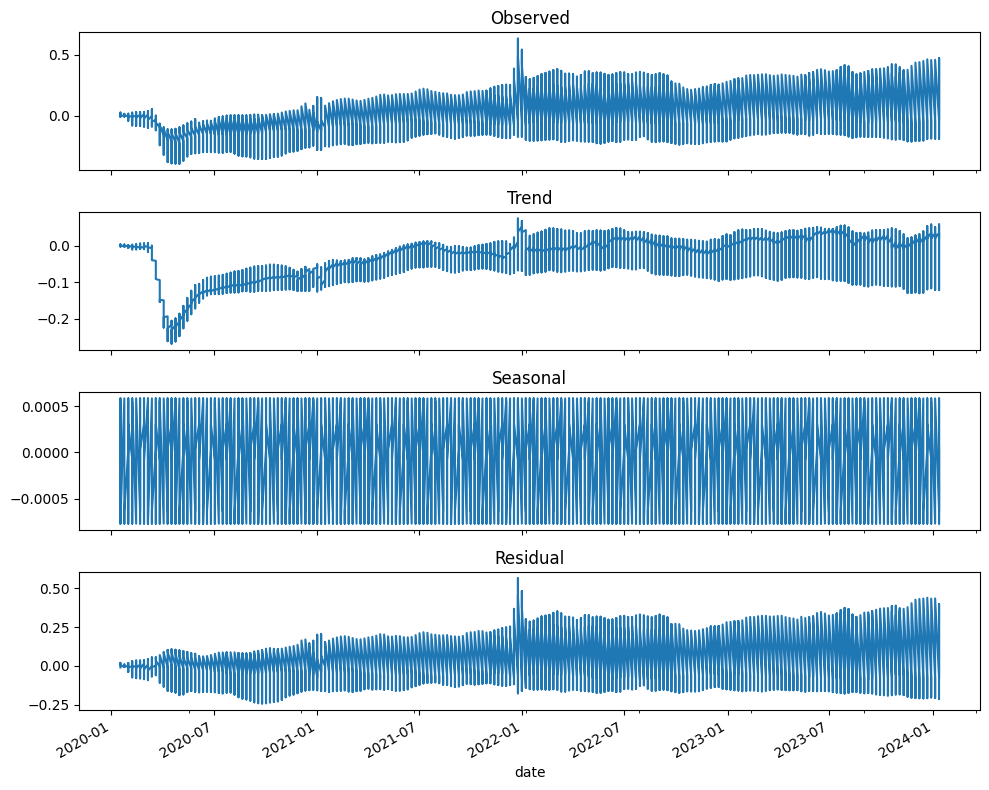

In [180]:
# Plot the decomposed components (STATE LEVEL)
fig, axes = plt.subplots(4, 1, figsize=(10, 8), sharex=True)
result_state.observed.plot(ax=axes[0], title='Observed')
result_state.trend.plot(ax=axes[1], title='Trend')
result_state.seasonal.plot(ax=axes[2], title='Seasonal')
result_state.resid.plot(ax=axes[3], title='Residual')
plt.tight_layout()
plt.show()

## National Level

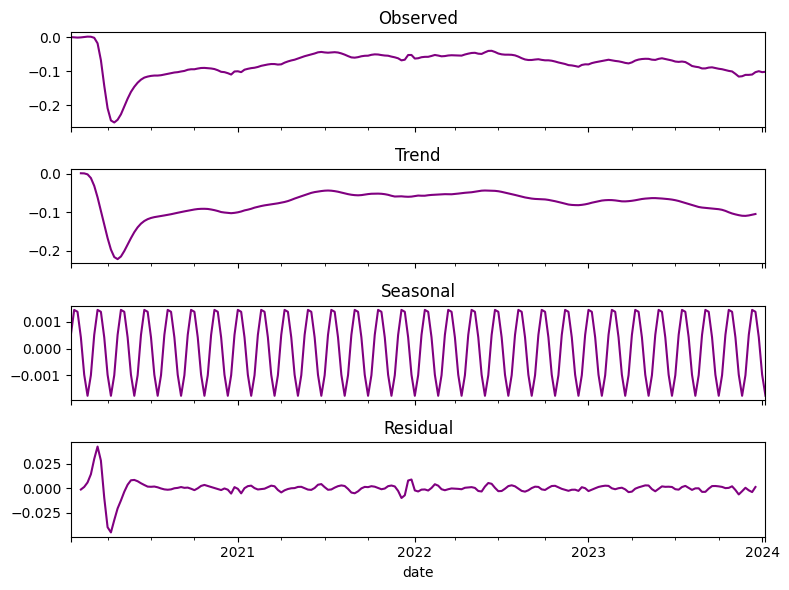

In [167]:
# Plot the decomposed components (NATIONAL LEVEL)
fig, axes = plt.subplots(4, 1, figsize=(8, 6), sharex=True)
result_natl.observed.plot(ax=axes[0], title='Observed', color = 'purple')
result_natl.trend.plot(ax=axes[1], title='Trend', color = 'purple')
result_natl.seasonal.plot(ax=axes[2], title='Seasonal', color = 'purple')
result_natl.resid.plot(ax=axes[3], title='Residual', color = 'purple')
plt.tight_layout()
plt.show()

**Interpreting the time series decompositions plots**

Trend Component <br>
- There's an observed recession at all geographic levels, with all hitting an all-time low immediately after the pandemic hit in 2020. In all, you can see that there's a rise in employment rates by the time July 2020 comes around. On the city level, the employment rate generally stays constant after July 2020, and never recovers to the pre-pandemic levels of January 2020. This is not the case at the state level, where the employment rate is on a general rise from 2020, and actually surpasses pre-pandemic levels in January 2024. At a national level, the employment rate is on a general rise from July 2020 through half of 2021, and levels off in 2022 (with a slight decrease heading into 2024), never quite surpassing the pre-pandemic employment rate. However, on a national scale, the employment rate is higher than on a city-by-city basis.
  
Seasonal Component <br>
- The data frequency of the dataset was weekly. As the peaks and the troughs are relatively small, this suggests that there is no huge difference in employment rate based solely on the day of the week, and that any short-term fluctuations seen in the graph are not related to traditional seasonal hiring patterns. This can be said for all geographic levels.
  
Residual Component <br>
- On the city level, the residual remains small, while there's a small spike in the residual plot for the state level at the beginning of 2022, as well as a spike at the beginning of 2020 and trough after the pandemic hits in 2020 at the national level. This could mean there's outliers in the data corresponding to these time points, or that specific events occurred that led to significant impacts on employment (which would explain the spike and trough in the residual plot at national level in 2020 when the pandemic occurred).

**Multivariate Analysis**

In [194]:
#Using a correlation matrix to show pairwise correlation btwn diff vars (each cell is their pearson correlation coefficient)
corr_matrix_city = df_city.corr()
corr_matrix_state = df_state.corr()
corr_matrix_natl = df_natl.corr()

In [223]:
corr_matrix_city

,year,month,day,cityid,emp,emp_incq1,emp_incq2,emp_incq3,emp_incq4,emp_incmiddle,emp_incbelowmed,emp_incabovemed
year,1.000000e+00,-3.852191e-02,-4.244045e-02,1.576430e-14,0.036226,0.108063,0.050770,0.125187,0.057233,0.082194,0.099412,0.046391
month,-3.852191e-02,1.000000e+00,-1.886942e-02,1.431027e-16,-0.084870,-0.112023,-0.037109,-0.037655,0.021286,-0.044099,-0.079886,-0.011055
day,-4.244045e-02,-1.886942e-02,1.000000e+00,-4.291373e-17,0.028373,0.035931,0.022500,0.013436,0.017367,0.021033,0.033054,0.030081
cityid,1.576430e-14,1.431027e-16,-4.291373e-17,1.000000e+00,0.045790,-0.100586,0.037751,0.112371,0.116172,0.065392,-0.028349,0.141241
emp,3.622554e-02,-8.486995e-02,2.837256e-02,4.579001e-02,1.000000,0.581016,0.888252,0.813676,0.442040,0.939144,0.945778,0.545145
emp_incq1,1.080631e-01,-1.120233e-01,3.593146e-02,-1.005858e-01,0.581016,1.000000,0.329671,0.409184,0.220707,0.381290,0.655875,0.275196
emp_incq2,5.077034e-02,-3.710939e-02,2.249988e-02,3.775098e-02,0.888252,0.329671,1.000000,0.675571,0.400162,0.963559,0.887197,0.516860
emp_incq3,1.251865e-01,-3.765509e-02,1.343569e-02,1.123711e-01,0.813676,0.409184,0.675571,1.000000,0.407206,0.832743,0.685064,0.429502
emp_incq4,5.723309e-02,2.128604e-02,1.736726e-02,1.161718e-01,0.442040,0.220707,0.400162,0.407206,1.000000,0.432076,0.407148,0.814545
emp_incmiddle,8.219381e-02,-4.409905e-02,2.103310e-02,6.539197e-02,0.939144,0.381290,0.963559,0.832743,0.432076,1.000000,0.883866,0.537815


In [219]:
#CITY WIDE 
close_to_one = corr_matrix_city[(corr_matrix_city > 0.90) & (corr_matrix_city < 1.0)]
close_to_neg_one = corr_matrix_city[(corr_matrix_city > -1.0) & (corr_matrix_city < -0.90)]

close_to_extremes = np.where(close_to_one.notna(), close_to_one, close_to_neg_one)

#convert np array back to df 
close_to_extremes = pd.DataFrame(close_to_extremes, index=close_to_one.index, columns=close_to_one.columns)
close_to_extremes = close_to_extremes.dropna(axis=1, how='all').dropna(axis=0, how='all')

print("Correlations close to 1 or -1 for city:")
print(close_to_extremes)
print(" ")

#STATE WIDE
close_to_one = corr_matrix_state[(corr_matrix_state > 0.90) & (corr_matrix_state < 1.0)]
close_to_neg_one = corr_matrix_state[(corr_matrix_state > -1.0) & (corr_matrix_state < -0.90)]

close_to_extremes = np.where(close_to_one.notna(), close_to_one, close_to_neg_one)

#convert np array back to df 
close_to_extremes = pd.DataFrame(close_to_extremes, index=close_to_one.index, columns=close_to_one.columns)
close_to_extremes = close_to_extremes.dropna(axis=1, how='all').dropna(axis=0, how='all')

print("Correlations close to 1 or -1 for state:")
print(close_to_extremes)
print(" ")

#NATIONALLY 
close_to_one = corr_matrix_natl[(corr_matrix_natl > 0.90) & (corr_matrix_natl < 1.0)]
close_to_neg_one = corr_matrix_natl[(corr_matrix_natl > -1.0) & (corr_matrix_natl < -0.90)]

close_to_extremes = np.where(close_to_one.notna(), close_to_one, close_to_neg_one)

#convert np array back to df 
close_to_extremes = pd.DataFrame(close_to_extremes, index=close_to_one.index, columns=close_to_one.columns)
close_to_extremes = close_to_extremes.dropna(axis=1, how='all').dropna(axis=0, how='all')

print("Correlations close to 1 or -1 for national:")
print(close_to_extremes)
print(" ")


Correlations close to 1 or -1 for city:
                      emp  emp_incq2  emp_incmiddle  emp_incbelowmed
emp                   NaN        NaN       0.939144         0.945778
emp_incq2             NaN        NaN       0.963559              NaN
emp_incmiddle    0.939144   0.963559            NaN              NaN
emp_incbelowmed  0.945778        NaN            NaN              NaN
 
Correlations close to 1 or -1 for state:
                      emp  emp_incq2  emp_incq4  emp_incmiddle  \
emp                   NaN        NaN        NaN       0.956423   
emp_incq2             NaN        NaN        NaN       0.957358   
emp_incq4             NaN        NaN        NaN            NaN   
emp_incmiddle    0.956423   0.957358        NaN            NaN   
emp_incbelowmed  0.945842        NaN        NaN            NaN   
emp_incabovemed       NaN        NaN   0.939119            NaN   

                 emp_incbelowmed  emp_incabovemed  
emp                     0.945842              NaN  
emp_i

**Visualizing correlation matrix results using a heatmap**

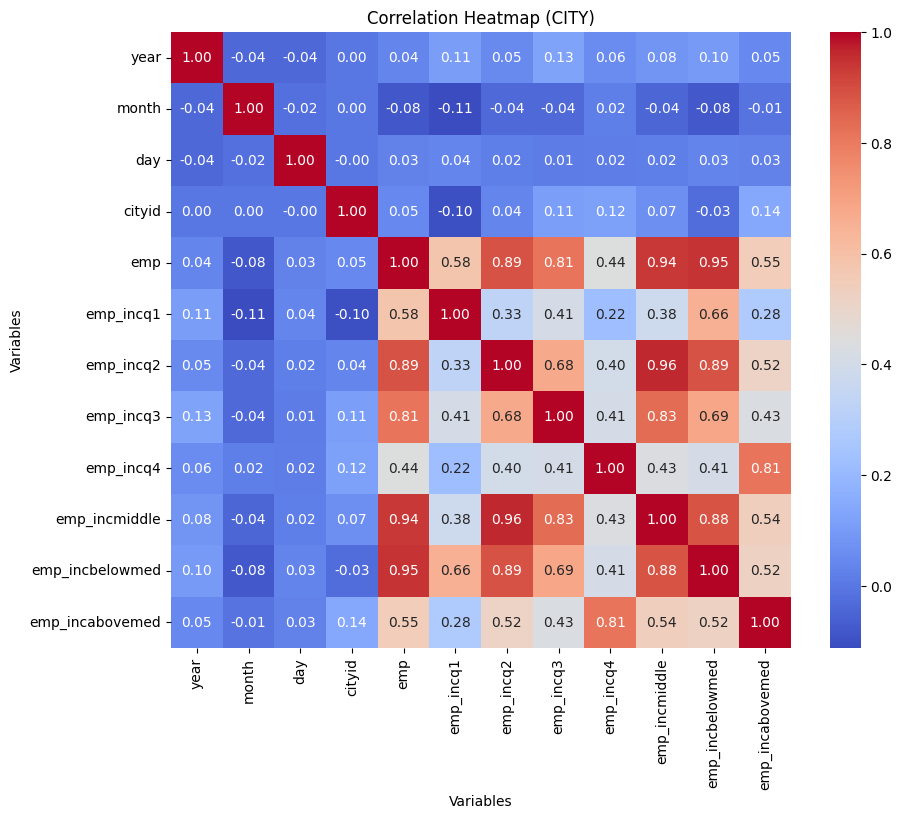

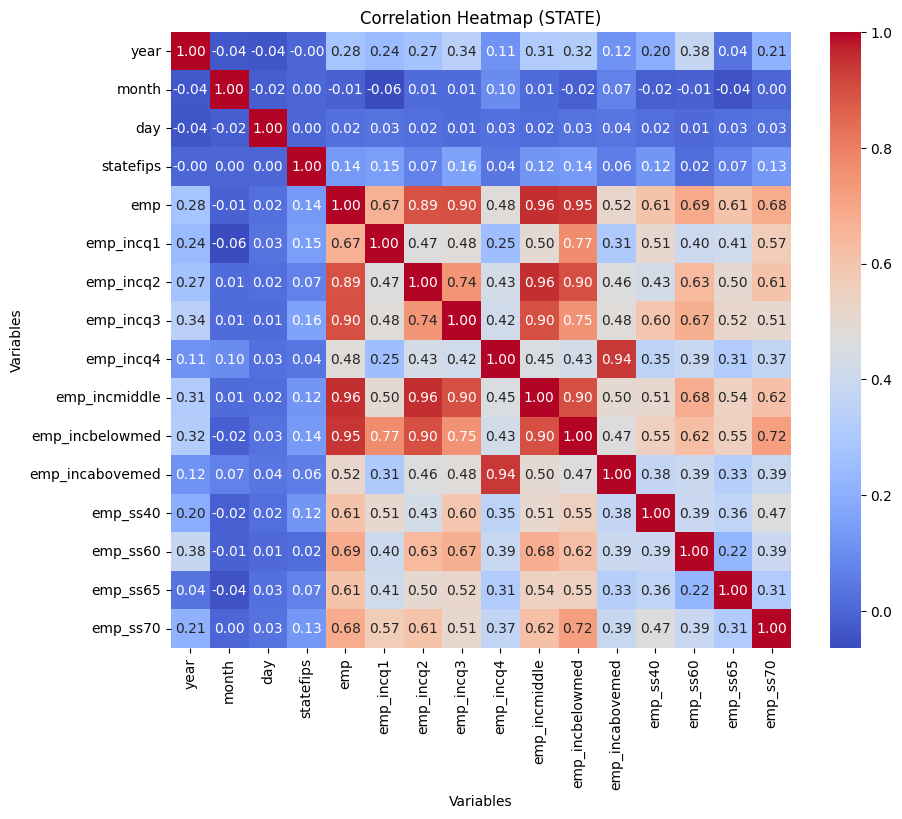

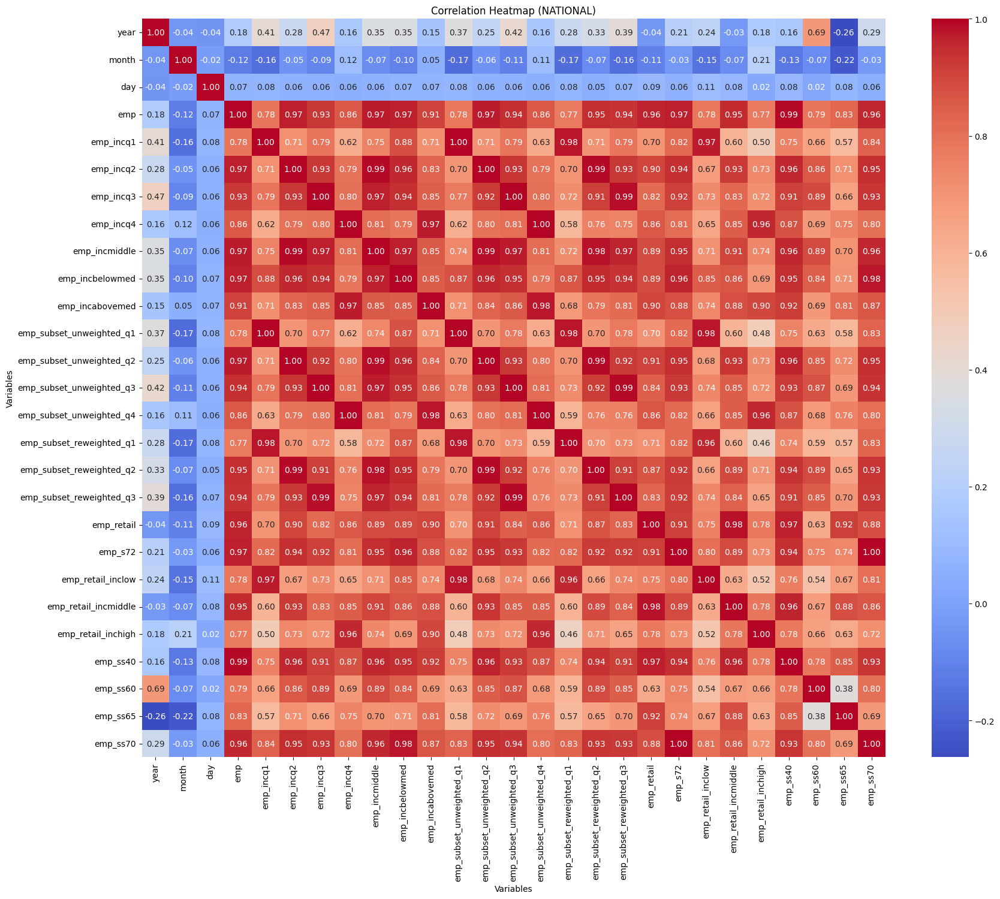

In [230]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 8))  # Set the figure size
sns.heatmap(corr_matrix_city, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap (CITY)')  # Set the title of the heatmap
plt.xlabel('Variables')  # Set the x-axis label
plt.ylabel('Variables')  # Set the y-axis label
plt.show()

plt.figure(figsize=(10, 8))  # Set the figure size
sns.heatmap(corr_matrix_state, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap (STATE)')  # Set the title of the heatmap
plt.xlabel('Variables')  # Set the x-axis label
plt.ylabel('Variables')  # Set the y-axis label
plt.show()

plt.figure(figsize=(20, 16))  # Set the figure size
sns.heatmap(corr_matrix_natl, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap (NATIONAL)')  # Set the title of the heatmap
plt.xlabel('Variables')  # Set the x-axis label
plt.ylabel('Variables')  # Set the y-axis label
plt.show()

**Machine Learning Model for Prediction**
Estimating the employment rate based on what quartile of wage distribution they're in and what NAICS sector they work in

In [ ]:
#Creating a 

## What's left to do 
**Machine Learning Models for Prediction or Classification (if applicable):**

- Build predictive models using machine learning algorithms (e.g., regression, classification) to predict outcomes or classify data into categories. Evaluate model performance using metrics like accuracy, precision, recall, F1-score, ROC-AUC, etc.

**Geospatial Analysis (if applicable):**
- Explore geospatial data using maps to visualize spatial distributions and patterns.
Analyze spatial relationships, clusters, or anomalies using techniques like spatial autocorrelation or hotspot analysis.